In [2]:
import matplotlib.pyplot as plt   
import cv2                        
import numpy as np                
import os                         
import glob                       
import math                       

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
testImage = [path for path in glob.glob("test_images/*.jpg")] 

In [5]:
"""                                                                           
imageShow function will take the list of images and show them in three column 
using matplotlib, and we will use this function for all the test              
"""                                                                                                                                                                                                                                 
def imageShow(images, cmap=None):                                             
    column = 2                                                                
    row = (len(images) + 1) // column                                         
    plt.figure(figsize=(18, 23))                                                
    for num, image in enumerate(images):                                      
        plt.subplot(row, column, num + 1)                                     
        cmap = 'gray' if len(image.shape) == 2 else cmap                      
        plt.imshow(image, cmap)                                               
        plt.xticks([])                                                        
        plt.yticks([])                                                        
    plt.show()                                                                
                                                                              

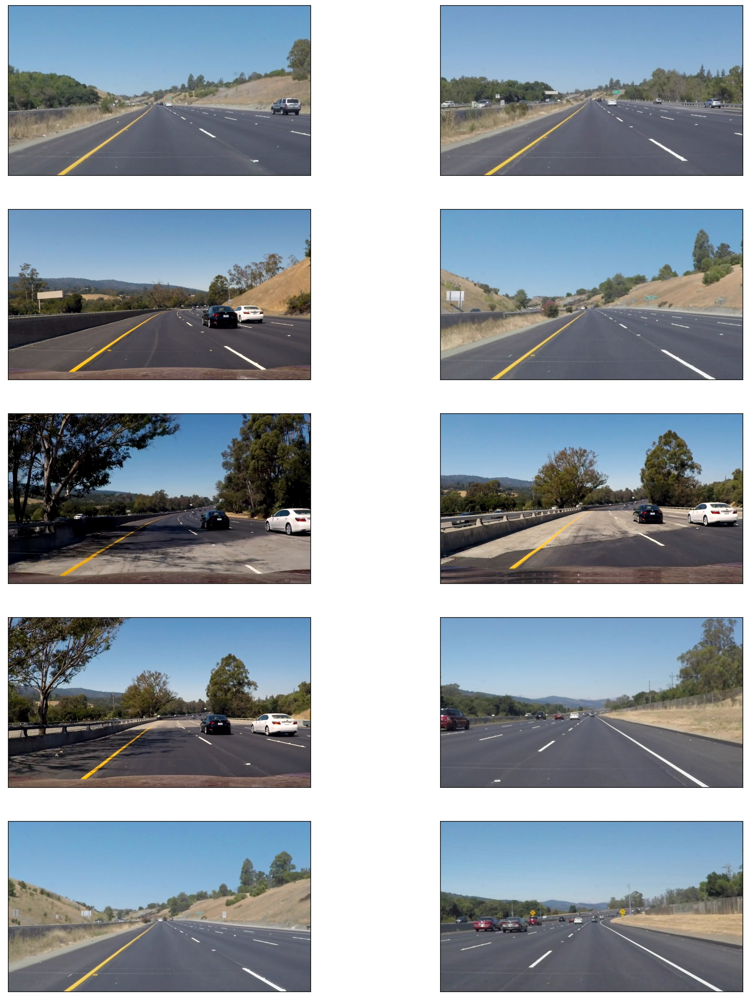

In [6]:
test_images = [plt.imread(image_path) for image_path in testImage] 
imageShow(test_images)

In [7]:
"""                                                                                                         
ROI is Region Of Interest, where we basically make unwanted information in image to 0 or black,             
for example, the upper half part of image is useless where most of them are sky                             
so our region of interest is lower half part of image, so we make upper part black, and retain              
the lower part.                                                                                             
"""                                                                                                         
def ROI(image):                                                                                             
    # first we will create a same size of image with all black pixel or black image                         
    mask = np.zeros_like(image)                                                                             
    if len(image.shape) > 2:                                                                                
        ROIMask = (255,) * image.shape[2]                                                                   
    else:                                                                                                   
        ROIMask = 255                                                                                       
                                                                                                            
    # here are the vertices for our ROI which will be white and it will be draw over black mask             
    row, col = image.shape[:2]                                                                              
    left_lower = [col * 0.1, row * 0.95]                                                                    
    left_upper = [col * 0.4, row * 0.6]                                                                     
    right_lower = [col * 0.9, row * 0.95]                                                                   
    right_upper = [col * 0.6, row * 0.6]                                                                    
    vertices = np.array([[left_lower, left_upper, right_upper, right_lower]], dtype=np.int32)               
                                                                                                            
    # here it will draw the above given vertices shape on black mask that we create at beginning            
    cv2.fillPoly(mask, vertices, ROIMask)                                                                   
                                                                                                            
    ROI_image = cv2.bitwise_and(image, mask)                                                                
    return ROI_image                                                                                        
                                                                                                            

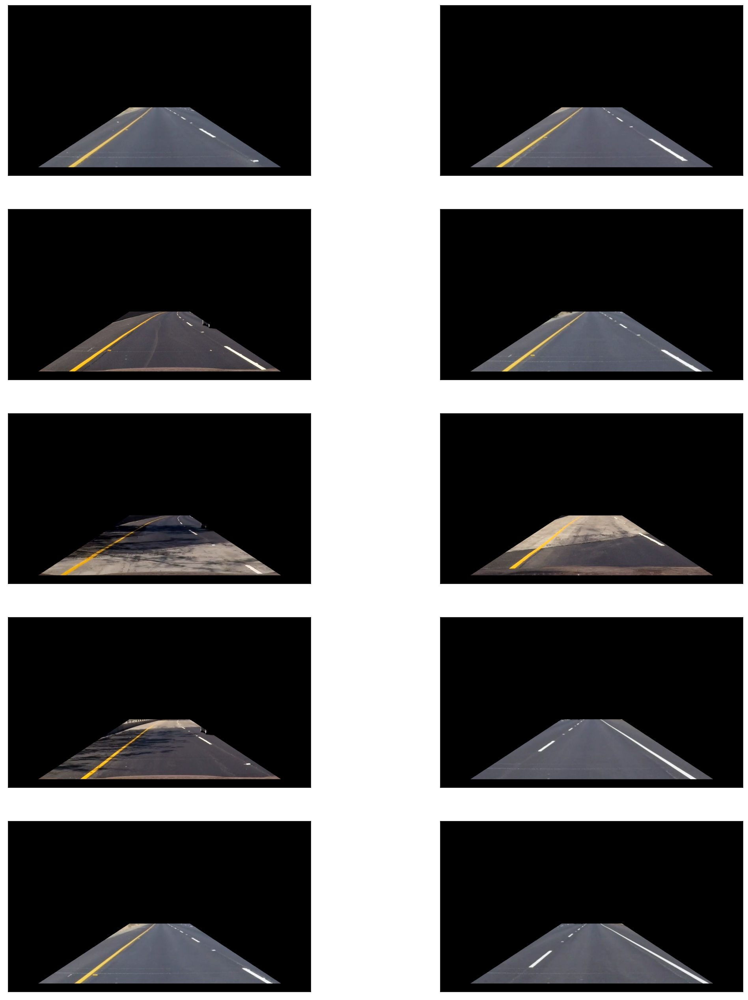

In [8]:
ROIImages = [ROI(image) for image in test_images]
imageShow(ROIImages)

In [9]:
"""                                                                
this function will convert the RGB Image to HLS image using OpenCV 
"""                                                                
def convertImageToHLS(image):                                      
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)                  

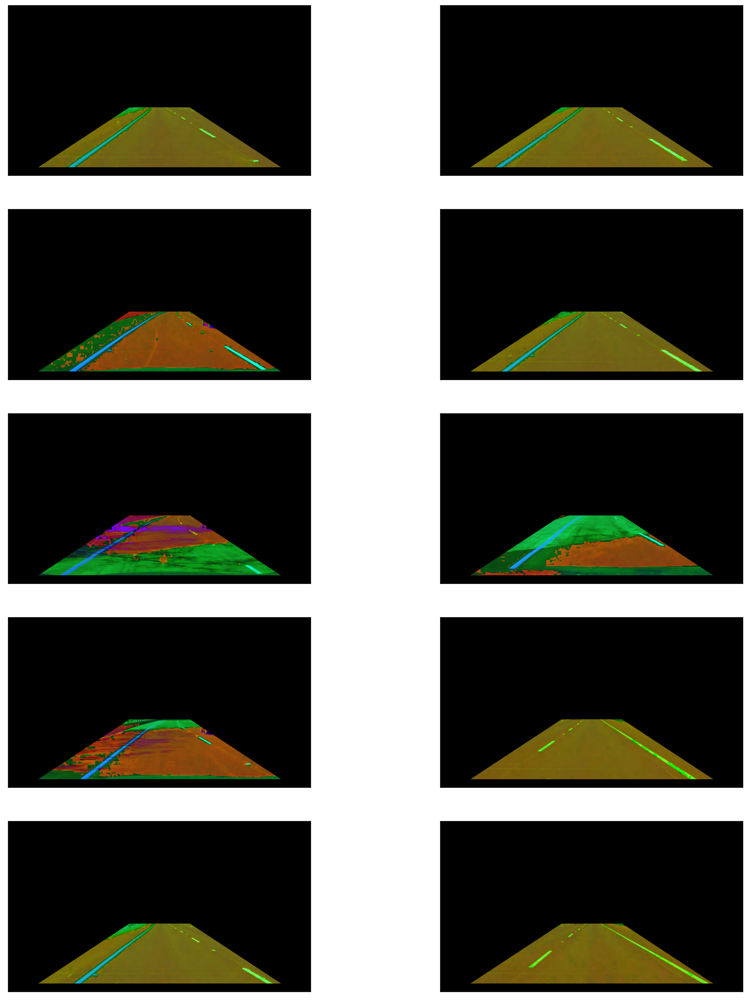

In [10]:
HLSImages = [convertImageToHLS(image) for image in ROIImages]
imageShow(HLSImages)

In [11]:
"""                                                                                                                   
this function will select the white and yellow pixel value only, if the pixel value is                                
not in the range of yellow and white threshold then it will make it 0, or black                                       
because usually the highway road lane color is either yellow or white and all other color are not useful              
"""                                                                                                                   
def selectWhiteAndYellow(image):                                                                                      
    # lower and upper threshold for white pixel                                                                       
    lowerWhite = np.uint8([0, 200, 0])                                                                                
    upperWhite = np.uint8([255, 255, 255])                                                                            
    # lower and upper threshold for yellow pixel                                                                      
    lowerYellow = np.uint8([10, 0, 100])                                                                              
    upperYellow = np.uint8([40, 255, 255])                                                                            
    # extract the pixel which is in white threshold and all other make it black                                       
    maskWhite = cv2.inRange(image, lowerWhite, upperWhite)                                                            
    # same here except it is yellow threshold, all other black                                                        
    maskYellow = cv2.inRange(image, lowerYellow, upperYellow)                                                         
    # here we will take both white and yellow threshold and if the pixel is either in                                 
    # white and yellow threshold, then we choose it else make the pixel black or ignore                               
    orMask = cv2.bitwise_or(maskWhite, maskYellow)                                                                    
    # then we apply this mask to the input image, so basically if the pixel in orMask image is white                  
    # then it will retain the pixel value, else make it 0 or black                                                    
    # or we can define as if both image and ormask has value,                                                         
    # then retain the pixel value else make 0 (and definition)                                                        
    final_mask = cv2.bitwise_and(image, image, mask=orMask)                                                           
    return final_mask                                                                                                 

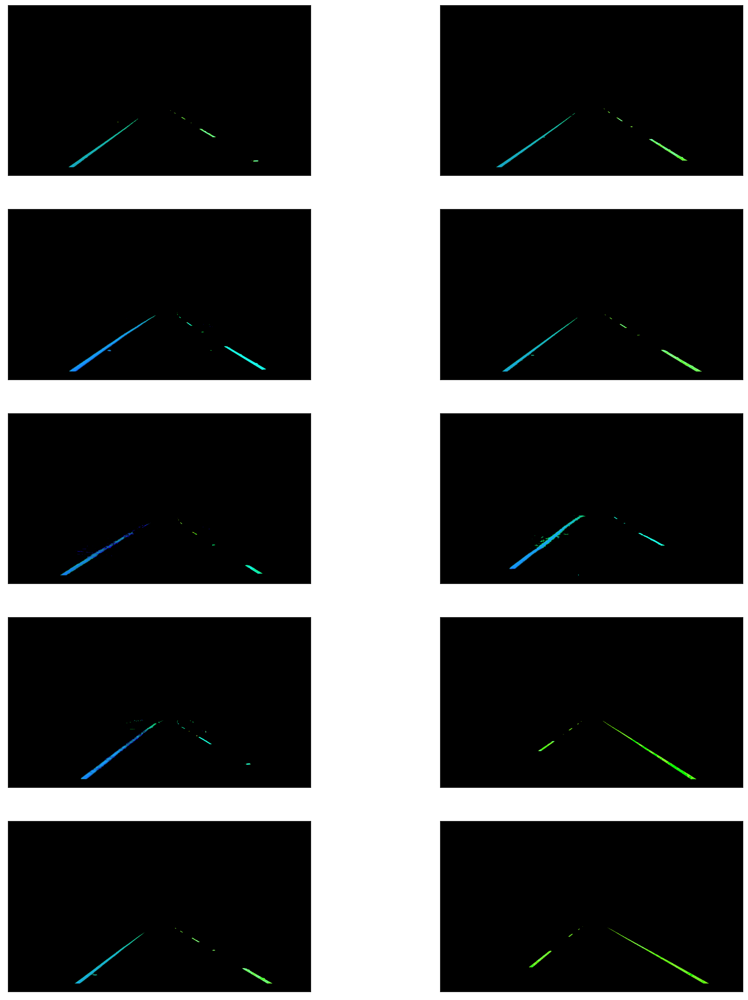

In [12]:
whiteNyellowImages = [selectWhiteAndYellow(image) for image in HLSImages]
imageShow(whiteNyellowImages)

In [13]:
"""                                                                        
This function is to convert the RGB image to grayscale image using OpenCV  
"""                                                                        
def grayscale(image):                                                      
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)                                                     

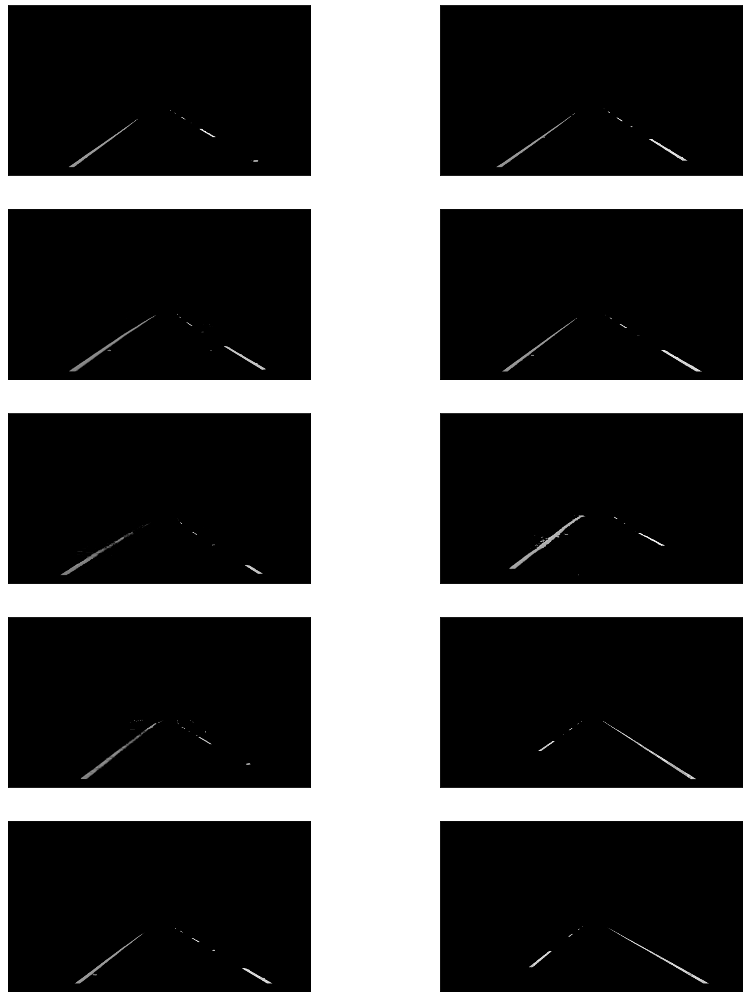

In [14]:
grayscaleImage = [grayscale(image) for image in whiteNyellowImages]
imageShow(grayscaleImage)

In [15]:
"""                                                                                      
this function is normalizing the pixel value with surrounding pixel value,               
or in other terms, it is blurring ro smoothing the image by convolving the kernel size   
square matrix over the image and applying the Gaussian algorithm.                        
"""                                                                                      
def gaussainBlur(image, kernelSize=15):                                                  
    return cv2.GaussianBlur(image, (kernelSize, kernelSize), 0)                          

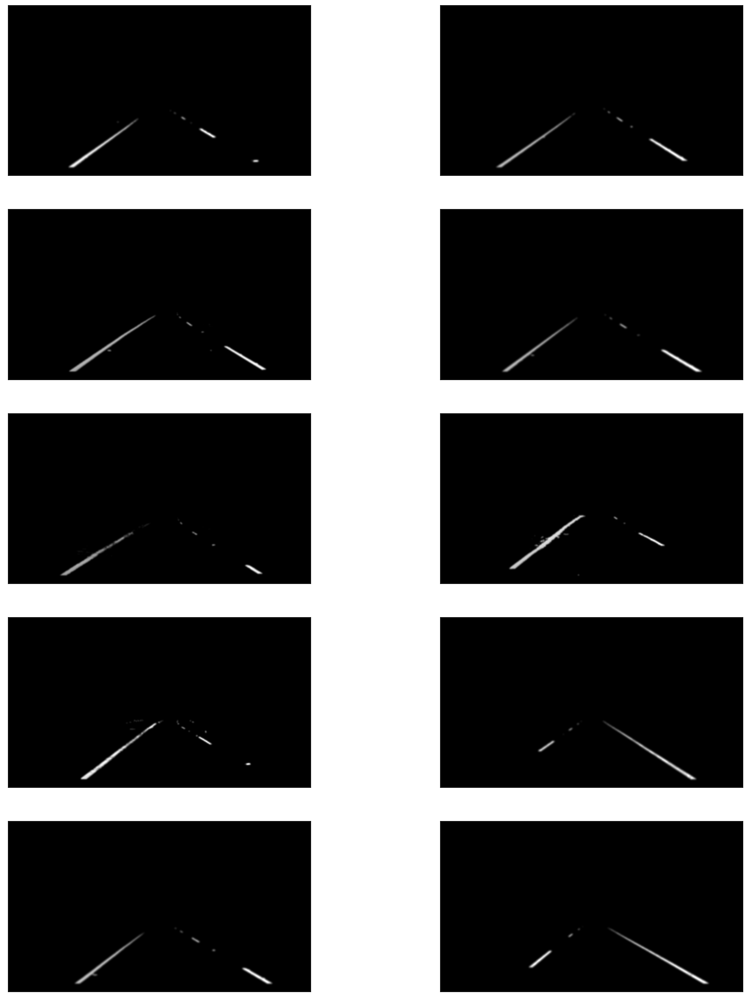

In [16]:
blurImage = [gaussainBlur(image) for image in grayscaleImage]
imageShow(blurImage)

In [17]:
"""                                                                                              
this function is using the Canny edge detection algorithm from OpenCV library to detect the edge,
"""                                                                                              
def cannyEdgeDetection(image, lowerThreshold=50, upperThreshold=150):                            
    return cv2.Canny(image, lowerThreshold, upperThreshold)                                      

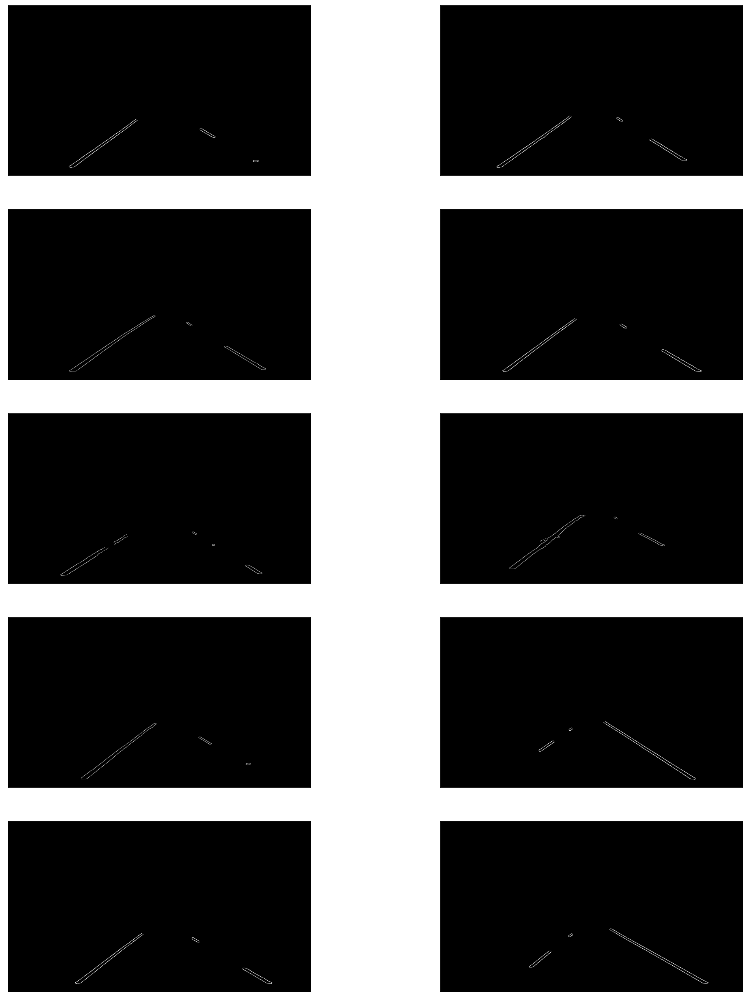

In [18]:
edgedetectImage = [cannyEdgeDetection(image) for image in blurImage]
imageShow(edgedetectImage)

In [19]:
def houghLineTransformation(image):                                                                       
    return cv2.HoughLinesP(image, rho=1, theta=np.pi/180, threshold=20, minLineLength=20, maxLineGap=300) 

In [20]:
def slope(x1, y1, x2, y2):
    return (y2 - y1) / ((x2 - x1) * 1.0)

def yIntercept(x, y, slope):
    """
    for y-intercept, both y1 and y2 or x2 or x1 will have same y-intercept since it is same line
    so here we will take y1 and x1
    """
    return y - (slope * x)

In [21]:
def bestLine(linesFromHoughLineP):
    """
    Here input is from the output of hough Line transformation 
    
    The idea here is that hough line output many line that it think is line, 
    so we need to pick the best two single line which will represent the left lane
    and right lane. Here we will use dictionary, where key is y-intercept and value is list 
    of slope and y-intercept
    
    To do that we will loop though the output of hough line and separate them by slope value
    Slope = (y2 - y1) / (x2 - x1)
    since cordinate of the image is reverse as 0,0 is at the upper left side, so y coordinate 
    is also reverse so left lane (in normal coordinate, it is slope up) but here left lane is 
    negative slope and right lane is positive slope
    
    as we separate the slope, we will also calculate the y-intercept, and it will be stored in 
    different array, later, y-intercept will decide which is the best line by taking the median.
    
    y = mx + c         m = slope,  x = input, c = y-intercept
    c = y - mx         y-intercept formula
    
    once we get the median of y-intercept for both lanes, then we find the slope and y-intercept for this line
    in dictionary using y-intercept
    """
    left_lane = dict()
    right_lane = dict()
    left_intercept = []
    right_intercept = []
    
    for line in linesFromHoughLineP:
        x1,y1,x2,y2 = line[0][0], line[0][1], line[0][2], line[0][3]
        if x1 == x2: 
            # EDGE CASE: if x1 and x2 are same, then it is point
            continue
        m = slope(x1, y1, x2, y2)
        c = yIntercept(x1, y1, m)
        if m > 0:
            # it is right lane as I have decribe above
            right_lane[c] = [m,c]
            right_intercept.append(c)
        elif m < 0:
            left_lane[c] = [m,c]
            left_intercept.append(c)
        else:
            # if it 0, then ignore it because lane can't be straight line with no slope 
            continue
    # now we have separated the both left lane and right lane
    medianYinterceptLeftLane  = left_intercept[len(left_intercept) // 2]
    medianYinterceptRightLane = right_intercept[len(right_intercept) // 2]
    # we find the best lane coordinate in dictionary using median y-intercept as key
    bestLeftLaneLine = left_lane[medianYinterceptLeftLane]
    bestRightLaneLine = right_lane[medianYinterceptRightLane]
    bestLineForEachLane = [bestLeftLaneLine, bestRightLaneLine]
    return bestLineForEachLane         

In [22]:
def extrapolateLine(image, lines):
    slope_left = lines[0][0]
    yIntercept_left = lines[0][1]
    slope_right = lines[1][0]
    yIntercept_right = lines[1][1]
    
    y1 = image.shape[0]
    y2 = int (image.shape[0] // 1.6)
    
    x1_left = int((y1 - yIntercept_left) / slope_left)
    x2_left = int((y2 - yIntercept_left) / slope_left)
    
    x1_right = int((y1 - yIntercept_right) / slope_right)
    x2_right = int((y2 - yIntercept_right) / slope_right)
    
    return [[x1_left, y1, x2_left, y2], [x1_right, y1, x2_right, y2]]

In [23]:
def pipeline(image):
    roiImages = ROI(image)
    hlsImage = convertImageToHLS(roiImages)
    whiteYellowLine = selectWhiteAndYellow(hlsImage)
    grayscaleImage = grayscale(whiteYellowLine)
    smoothImage = gaussainBlur(grayscaleImage)
    edgeDetect = cannyEdgeDetection(smoothImage)
    probabilisticLineDetect = houghLineTransformation(edgeDetect)
    bestLines = bestLine(probabilisticLineDetect)
    extrapolateLines = extrapolateLine(image, bestLines)
    for line in extrapolateLines:   
        x1,y1,x2,y2 = line[0], line[1], line[2], line[3]   
        cv2.line(image, (x1, y1), (x2, y2), color=[0, 255, 0], thickness=15)
    return image                                                               
                                                            

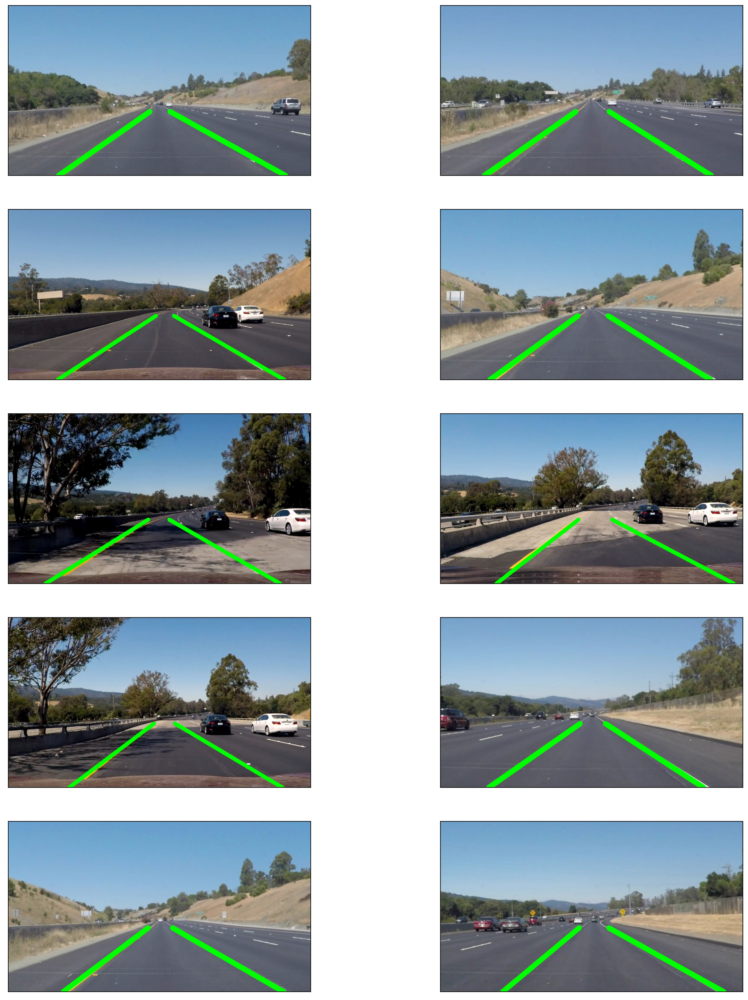

In [24]:
finalImages = [pipeline(image) for image in test_images]
imageShow(finalImages)

In [25]:
from moviepy.editor import VideoFileClip

counter = 0
output = "CS156_finalProject.mp4"
testVideo = VideoFileClip("test_videos/challenge.mp4")
out_clip = testVideo.fl_image(pipeline)
%time out_clip.write_videofile(output, audio=False)
print(counter)

t:   3%|▎         | 8/251 [00:00<00:03, 76.98it/s, now=None]

Moviepy - Building video CS156_finalProject.mp4.
Moviepy - Writing video CS156_finalProject.mp4



Moviepy - Done !
Moviepy - video ready CS156_finalProject.mp4
CPU times: user 5.1 s, sys: 1.16 s, total: 6.26 s
Wall time: 6.6 s
0
